# **Product Recognition of Food Products**

## Image Processing and Computer Vision - Assignment Module \#1


Contacts:

- Prof. Giuseppe Lisanti -> giuseppe.lisanti@unibo.it
- Prof. Samuele Salti -> samuele.salti@unibo.it
- Alex Costanzino -> alex.costanzino@unibo.it
- Francesco Ballerini -> francesco.ballerini4@unibo.it


Computer vision-based object detection techniques can be applied in super market settings to build a system that can identify products on store shelves.
An example of how this system could be used would be to assist visually impaired customers or automate common store management tasks like detecting low-stock or misplaced products, given an image of a shelf in a store.

## Task
Develop a computer vision system that, given a reference image for each product, is able to identify such product from one picture of a store shelf.

<figure>
<a href="https://imgbb.com/">
  <center>
  <img src="https://i.ibb.co/TwkMWnH/Screenshot-2024-04-04-at-14-54-51.png" alt="Screenshot-2024-04-04-at-14-54-51" border="0" width="300" />
</a>
</figure>

For each type of product displayed in the
shelf the system should report:
1. Number of instances;
1. Dimension of each instance (width and height in pixel of the bounding box that enclose them);
1. Position in the image reference system of each instance (center of the bounding box that enclose them).

#### Example of expected output
```
Product 0 - 2 instance found:
  Instance 1 {position: (256, 328), width: 57px, height: 80px}
  Instance 2 {position: (311, 328), width: 57px, height: 80px}
Product 1 – 1 instance found:
.
.
.
```

### Track A - Single Instance Detection
Develop an object detection system to identify single instance of products given one reference image for each item and a scene image.

The system should be able to correctly identify all the product in the shelves
image.

### Track B - Multiple Instances Detection
In addition to what achieved at step A, the system should also be able to detect multiple instances of the same product.

## Data
Two folders of images are provided:
* **Models**: contains one reference image for each product that the system should be able to identify.
* **Scenes**: contains different shelve pictures to test the developed algorithm in different scenarios. The images contained in this folder are corrupted by noise.

#### Track A - Single Instance Detection
* **Models**: {ref1.png to ref14.png}.
* **Scenes**: {scene1.png to scene5.png}.

#### Track B - Multiple Instances Detection
* **Models**: {ref15.png to ref27.png}.
* **Scenes**: {scene6.png to scene12.png}.

In [3]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

!cp -r /content/drive/MyDrive/AssignmentsIPCV/dataset.zip .
!unzip dataset.zip

Mounted at /content/drive
Archive:  dataset.zip
   creating: dataset/
  inflating: __MACOSX/._dataset      
   creating: dataset/scenes/
  inflating: __MACOSX/dataset/._scenes  
  inflating: dataset/.DS_Store       
  inflating: __MACOSX/dataset/._.DS_Store  
   creating: dataset/models/
  inflating: __MACOSX/dataset/._models  
  inflating: dataset/scenes/scene12.png  
  inflating: __MACOSX/dataset/scenes/._scene12.png  
  inflating: dataset/scenes/scene10.png  
  inflating: __MACOSX/dataset/scenes/._scene10.png  
  inflating: dataset/scenes/scene11.png  
  inflating: __MACOSX/dataset/scenes/._scene11.png  
  inflating: dataset/scenes/scene5.png  
  inflating: __MACOSX/dataset/scenes/._scene5.png  
  inflating: dataset/scenes/scene4.png  
  inflating: __MACOSX/dataset/scenes/._scene4.png  
  inflating: dataset/scenes/scene6.png  
  inflating: __MACOSX/dataset/scenes/._scene6.png  
  inflating: dataset/scenes/scene7.png  
  inflating: __MACOSX/dataset/scenes/._scene7.png  
  inflating: 

## Evaluation criteria
1. **Procedural correctness**. There are several ways to solve the assignment. Design your own sound approach and justify every decision you make;

2. **Clarity and conciseness**. Present your work in a readable way: format your code and comment every important step;

3. **Correctness of results**. Try to solve as many instances as possible. You should be able to solve all the instances of the assignment, however, a thoroughly justified and sound procedure with a lower number of solved instances will be valued **more** than a poorly designed approach.

# **Assignment Module 1**

**Initialization**: Importing the required modules and showing one object to be found and one scene.

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import itertools

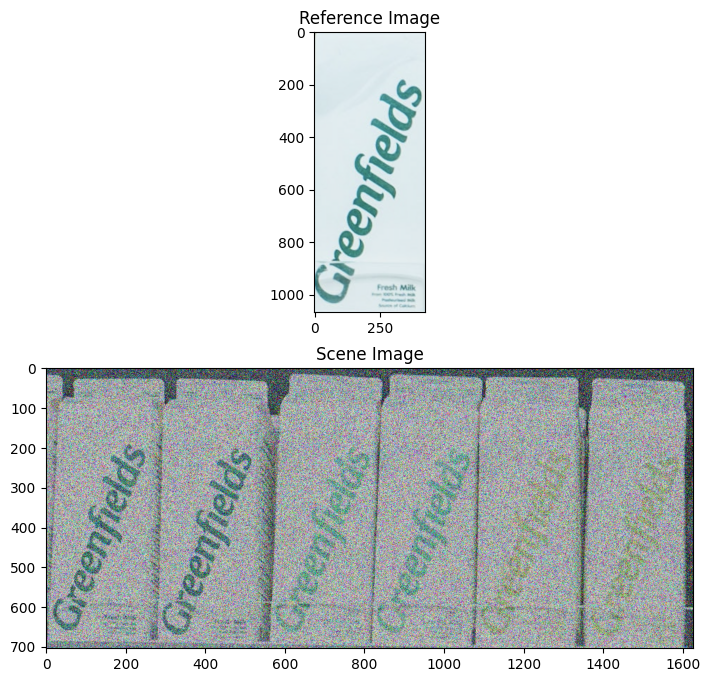

In [4]:
# loading images and changing colormap
img_query = cv2.imread("dataset/models/ref26.png")
img_query = cv2.cvtColor(img_query, cv2.COLOR_BGR2RGB)
img_train = cv2.imread("dataset/scenes/scene12.png")
img_train = cv2.cvtColor(img_train, cv2.COLOR_BGR2RGB)

# plotting
plt.figure(figsize = (16, 8))

plt.subplot(2,1,1)
plt.imshow(img_query)
plt.title('Reference Image')

plt.subplot(2,1,2)
plt.imshow(img_train)
plt.title('Scene Image')
plt.show()




As we can notice, the scene images are very noisy. We need to clean them up, using a Median Filter to remove Salt-and-Pepper noise and smoothing them with a Bilateral Filter, to get rid of possible Gaussian Noise which cannot be dealt with the Median Filter. Linear filtering would be ineffective toward impulse noise since it would spread it all over.

The **Median Filter** is a non-linear filter that smooths the image taking the median value of the pixels of the neighborhood defined by the kernel. This allows to clean-up the high intensity noise without blurring the edges significantly.

The **Bilateral Filter** is a non-linear filter ideal to remove Gaussian Noise. It preserves edges, that is crucial in our case. It averages the pixels within the kernel based on their similarity in value and distance to the central pixel, which helps maintain sharp boundaries while smoothing the rest of the image.

This order of application is chosen for a significant reason: applying first a gaussian filter would spread the impulse noise in the image.
Also the **Non-local Means Filter** has been tried, in substitution of the Bilateral Filter. Despite the filter achieving higher number of SIFT keypoints in the scene-image, this led to overall a lower number of good matches with the reference image.

### Hyperparameter selection and basic functions

What filters should we use? How many times should we apply them?
Since in our original image we observed both Salt-and-Pepper noise and Gaussian noise we decided to use a Median Filter and followed by a Bilateral Filter or a Non-local Means Filter.

We opted for a **grid search** algorithm in order to analyze all the possible combinations. To evaluate the performance of each filtering operation, we decided to consider the number of matches found between the keypoints of the object in the image and the keypoints of the reference image. To match the keypoints, we used a **Brute-Force Matcher** that allows us to obtain a more accurate matching, at the expense of a longer processing time.

As an example, we've taken the ref26 and we tried to detect it in the scene12.

In [4]:
def denoise_and_match_sift(img1, img2, filters, params, iterations_range, debug=False):
    """
    Function to apply median, bilateral, or non-local means filters multiple times and find the configuration
    that maximizes keypoint matches using SIFT.

    Args:
        img1 (numpy array): First input image.
        img2 (numpy array): Second input image.
        filters (list of str): List of filter names to apply. Options: ['median', 'bilateral', 'nl_means']
        params (dict): Parameters for each filter, with filter name as keys and corresponding parameter ranges as values.
        iterations_range (list): Range of possible iterations.
        debug (bool): If True, print intermediate results.

    Returns:
        best_row['match_count'] (int): Maximum number of matches obtained.
        best_row['params'] (dict): The best configuration of parameters.
        best_row['iterations'] (tuple): Recommended iterations for each filter.
    """
    # Initialize the SIFT detector
    sift = cv2.SIFT_create()

    # Initialize Brute-Force Matcher with L2 distance (used for SIFT descriptors)
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

    results = []

    # Generate all combinations of iterations
    iterations = list(itertools.product(iterations_range, iterations_range))

    # Generate parameter combinations based on the selected filters
    if 'bilateral' in filters:
        params_combination = list(itertools.product(
            params['median']['ksize'],
            params['bilateral']['d'],
            params['bilateral']['sigmaColor'],
            params['bilateral']['sigmaSpace']
        ))
    elif 'nl_means' in filters:
        params_combination = list(itertools.product(
            params['median']['ksize'],
            params['nl_means']['h'],
            params['nl_means']['templateWindowSize'],
            params['nl_means']['searchWindowSize']
        ))
    else:
        raise ValueError("Invalid filter selection. Choose 'bilateral' or 'nl_means'.")

    for it in iterations:
        for param_set in params_combination:
            k_size = param_set[0]
            denoised_img1 = img1.copy()

            # Apply the median filter multiple times
            for _ in range(it[0]):
                denoised_img1 = cv2.medianBlur(denoised_img1, k_size)

            # Apply the chosen filter
            if 'bilateral' in filters:
                d, sigma_color, sigma_space = param_set[1:]
                for _ in range(it[1]):
                    denoised_img1 = cv2.bilateralFilter(denoised_img1, d, sigma_color, sigma_space)
                filter_params = {'d': d, 'sigma_color': sigma_color, 'sigma_space': sigma_space}
            elif 'nl_means' in filters:
                h, template_window, search_window = param_set[1:]
                for _ in range(it[1]):
                    denoised_img1 = cv2.fastNlMeansDenoisingColored(
                        denoised_img1, None, h, h, template_window, search_window
                    )
                filter_params = {'h': h, 'template_window': template_window, 'search_window': search_window}

            # Detect keypoints and descriptors
            kp1_denoised, des1_denoised = sift.detectAndCompute(denoised_img1, None)
            kp2_denoised, des2_denoised = sift.detectAndCompute(img2, None)

            # Match descriptors
            matches = bf.match(des1_denoised, des2_denoised)
            match_count = len(matches)

            # Save results
            results.append({
                'iterations': it,
                'params': {'k_size': k_size, **filter_params},
                'match_count': match_count
            })

    results = pd.DataFrame(results)

    if debug:
        # Show the first ten entries of the DataFrame, sorted by match_count
        print(results.sort_values(by='match_count', ascending=False).head(10))

    best_row = results.loc[results['match_count'].idxmax()]

    return best_row['match_count'], best_row['params'], best_row['iterations']

In [5]:
# Load and preprocess images
img1 = cv2.imread("dataset/models/ref26.png")
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread("dataset/scenes/scene12.png")
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

# Define filter parameter ranges
params = {
    'median': {'ksize': [3, 5, 7]},  # Kernel sizes for medianBlur
    'bilateral': {'d': [5, 9], 'sigmaColor': [25, 50], 'sigmaSpace': [25, 50]},  # Bilateral filter parameters
    'nl_means': {'h': [10, 15], 'templateWindowSize': [7, 9], 'searchWindowSize': [21, 31]}  # Non-local means parameters
}

# Define the range of iterations to test
iterations_range = [1, 2, 3, 4, 5]


Trying median + bilateral

In [ ]:
filters = ['median', 'bilateral']  # Choosing bilateral as the second filter
# Call to the function
best_match_count, best_params, best_iterations = denoise_and_match_sift(img1, img2, filters, params, iterations_range, debug=True)

print(f"Best match count: {best_match_count}")
print(f"Best parameters: {best_params}")
print(f"Best iterations: {best_iterations}")

    iterations                                             params  match_count
0       (1, 1)  {'k_size': 3, 'd': 5, 'sigma_color': 25, 'sigm...          164
1       (1, 1)  {'k_size': 3, 'd': 5, 'sigma_color': 25, 'sigm...          164
2       (1, 1)  {'k_size': 3, 'd': 5, 'sigma_color': 25, 'sigm...          164
3       (1, 1)  {'k_size': 3, 'd': 5, 'sigma_color': 25, 'sigm...          164
19      (1, 1)  {'k_size': 3, 'd': 9, 'sigma_color': 25, 'sigm...          158
18      (1, 1)  {'k_size': 3, 'd': 9, 'sigma_color': 25, 'sigm...          158
16      (1, 1)  {'k_size': 3, 'd': 9, 'sigma_color': 25, 'sigm...          158
17      (1, 1)  {'k_size': 3, 'd': 9, 'sigma_color': 25, 'sigm...          158
577     (2, 2)  {'k_size': 3, 'd': 5, 'sigma_color': 25, 'sigm...          155
576     (2, 2)  {'k_size': 3, 'd': 5, 'sigma_color': 25, 'sigm...          155
Best match count: 164
Best parameters: {'k_size': 3, 'd': 5, 'sigma_color': 25, 'sigma_space': 25}
Best iterations: (1, 1)


Trying median + nl_means

In [6]:
filters = ['median', 'nl_means']  # Choosing nl_means as the second filter
# Call the function
best_match_count, best_params, best_iterations = denoise_and_match_sift(
    img1, img2, filters, params, iterations_range, debug=True
)

print(f"Best match count: {best_match_count}")
print(f"Best parameters: {best_params}")
print(f"Best iterations: {best_iterations}")

    iterations                                             params  match_count
0       (1, 1)  {'k_size': 3, 'h': 10, 'template_window': 7, '...          105
1       (1, 1)  {'k_size': 3, 'h': 10, 'template_window': 7, '...          105
121     (2, 1)  {'k_size': 3, 'h': 10, 'template_window': 7, '...          105
363     (4, 1)  {'k_size': 3, 'h': 10, 'template_window': 9, '...          104
122     (2, 1)  {'k_size': 3, 'h': 10, 'template_window': 9, '...          103
482     (5, 1)  {'k_size': 3, 'h': 10, 'template_window': 9, '...          103
243     (3, 1)  {'k_size': 3, 'h': 10, 'template_window': 9, '...          103
480     (5, 1)  {'k_size': 3, 'h': 10, 'template_window': 7, '...          102
361     (4, 1)  {'k_size': 3, 'h': 10, 'template_window': 7, '...          102
360     (4, 1)  {'k_size': 3, 'h': 10, 'template_window': 7, '...          102
Best match count: 105
Best parameters: {'k_size': 3, 'h': 10, 'template_window': 7, 'search_window': 21}
Best iterations: (1, 1)


Best match count between the configurations: 164

**object_retrieve** is the function we used to find an instance of a certain object in a certain scene. To detect the keypoints we used SIFT. We also used SIFT to create the descriptors for them. To match the keypoints of the model with the ones of the scene we used BFMatcher, slower than FLANN but more accurate, calculating each descriptor in the first set to every descriptor in the second set.

After finding a satisfying amount of matches we would apply cv2.findHomography to find the transformation matrix from the model keypoints to the scene keypoints. Applying the said homography to the corners of the model image, allowed us to find the corners of the same object in the scene.

In [5]:
# Function used for object detection

def object_retrieve(img_query, img_train, min_match_count):

  '''
  Finds an instance of the queried object in the train image.

  Args:
    img_query: object to retrieve
    img_train: scene to detect the object from
    min_match_count: minimum number of matching key points to detect the object

  Returns:
    tuple: A tuple containing the number of matching keypoints found between the two images and the corners of the object detected
  '''

  sift = cv2.SIFT_create()                                                  #initiating sift detector
  kp_query, des_query = sift.detectAndCompute(img_query, None)             #keypoints and descriptors of query image
  kp_train, des_train = sift.detectAndCompute(img_train, None)             #keypoints and descriptors of scene image

  # if SIFT finds no (or too few) keypoints there is nothing to match
  if des_query is None or des_train is None or len(des_query) < 2 or len(des_train) < 2:
    return 0, np.zeros([4,1,2])

  bf = cv2.BFMatcher()
  matches = bf.knnMatch(des_query, des_train, k=2)                          #matching the 2 closest elements for each query descriptor

  good = []
  for match in matches:                                                     #filtering false matches with Lowe's ratio test
    if len(match) < 2:                                                      #skip query descriptors with fewer than 2 neighbors
      continue
    m, n = match
    if m.distance < 0.7*n.distance:   # 0.7
      good.append(m)


  if len(good) > (min_match_count):
    src_pts = np.float32([ kp_query[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
    dst_pts = np.float32([ kp_train[m.trainIdx].pt for m in good ]).reshape(-1,1,2)

    # Getting the coordinates of the corners of our query object in the train image

    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)         #calculating Homography through query and scene images

    if M is None:                                                          #homography can fail on degenerate point sets
      return len(good), np.zeros([4,1,2])

    h,w, _ = img_query.shape
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)   #selecting corners of our query image
    dst = cv2.perspectiveTransform(pts, M)                                  #applying perspective transformation to corners

    return len(good), dst

  else:
    return len(good), np.zeros([4,1,2])

The function **thresh_calculator** is a function that computes a minimum number of matches to be found between an image and its reference, in order to consider the detection good enough.

The user has to specify a percentage. The detection will be good enough only if at least that percentage of keypoints from the original image is found.

Example: The user set 10% as percentage. SIFT detects 1000 keypoints in the reference image. If at least 10% of them are matched (min_match_count: 100) we consider the detection as valid.

This principle will be used later in the notebook.

In [6]:
def thresh_calculator(img_src, percentage):

  '''
  Dynamic Thresholding based on a percentage of the number of keypoints detected.

  Args:
      img_src (numpy.ndarray): The Reference Image.
      percentage (int): percentage of Keypoints to compute the threshold
  '''

  sift = cv2.SIFT_create()                                      #initiating sift detector
  kp_src = sift.detect(img_src)                                 #finding keypoints of query image

  thresh = (percentage/100) * len(kp_src)

  return thresh

## Task A: Single Instances Detection

Task A: the goal of this task is to find the instances of the given products, in scenes 1 to 5. To do this we used some utility functions that perform different tasks.

### Utility functions

Function **template_match**: this function performs a template matching algorithm between a said template and an image. The image and the template are converted to greyscale. Subsequently, the template is resized, in order to be smaller than the image.
The template matching algorithm is performed and the best match value is returned. This value is in the interval [0,1] and it indicates the similarity between the template and the examined region.

In [7]:
def template_match(template, img):
    """
    Perform template matching on an image using a given template.

    Args:
        template (numpy.ndarray): The template image to match.
        img (numpy.ndarray): The input image to search for the template.
        debug (bool, optional): Whether to display debug information and visualization. Defaults to False.

    Returns:
        float: The best match value indicating the similarity between the template and the matched region.

    """
    method = 'TM_CCORR_NORMED'
    template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)

    # check on empty ROI
    if img.size == 0:
        print("Warning: Empty ROI provided to template_match. Returning 0.")
        return 0

    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    img_h, img_w = img.shape

    template = cv2.resize(template, (img_w - img_w % 10, img_h - img_h % 10))
    h, w = template.shape[::-1]

    # Apply template Matching
    res = cv2.matchTemplate(img, template, getattr(cv2, method))
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

    best_match = max_val
    top_left = max_loc
    bottom_right = (top_left[0] + h, top_left[1] + w)


    return best_match

Function **preprocess_scene**: this function loads the images and cleans them using the filters mentioned earlier.

In [8]:
def preprocess_scene(scene_path, k_size=3, d=5, sigmaColor=25, sigmaSpace=25):
    """
    Loads and preprocesses the scene image by applying median and bilateral filters.

    Parameters:
        scene_path (str): Path to the scene image.
        k_size (int): Kernel size for median filter.
        d, sigmaColor, sigmaSpace: Parameters for bilateral filter.

    Returns:
        img_filtered (ndarray): Filtered image.
    """
    img_train = cv2.imread(scene_path)
    img_train = cv2.cvtColor(img_train, cv2.COLOR_BGR2RGB)
    img_filtered = cv2.medianBlur(img_train, k_size)
    img_filtered = cv2.bilateralFilter(img_filtered, d, sigmaColor, sigmaSpace)
    return img_train, img_filtered

Function **load_product_image**: given a product ID, the image is loaded and the corresponding ndarray is returned.

In [9]:
def load_product_image(product_id):
    """
    Loads the product image for the given product ID.

    Parameters:
        product_id (int): ID of the product.

    Returns:
        img_query (ndarray): Loaded product image.
    """
    img_query_path = f"dataset/models/ref{product_id}.png"
    img_query = cv2.imread(img_query_path)
    return cv2.cvtColor(img_query, cv2.COLOR_BGR2RGB)

Function **highlight_product**: given the corners of the product, it highlights it drawing a green rectangle on the provided image. When thickness is set to -1 a whole box will be drawn. This will be used in multiple instance detection to avoid detecting the same object twice.

In [10]:
def highlight_product(img, corners, color=(0, 255, 0), thickness=5):
    """
    Highlights the found product on the scene image.

    Parameters:
        img (ndarray): Image to draw on.
        corners (array): Coordinates for the rectangle to draw.
        color (tuple): Color for the rectangle.
        thickness (int): Line thickness of the rectangle. (-1 draws full boxes)
    """
    cv2.rectangle(img, (int(corners[0][0][0]), int(corners[0][0][1])),
                  (int(corners[2][0][0]), int(corners[2][0][1])), color, thickness)

Function **calculate_object_position**: given the corners, it computes the coordinates of the centre, the width and the heigth of the object.

In [11]:
def calculate_object_position(corners):
    """
    Calculates the position, width, and height of the detected object.

    Parameters:
        corners (array): Coordinates for the object.

    Returns:
        dict: Information about object position and dimensions.
    """
    top_left = corners[0][0]
    bottom_right = corners[2][0]
    width = int(bottom_right[0] - top_left[0])
    height = int(bottom_right[1] - top_left[1])
    center_x = int(top_left[0] + width / 2)
    center_y = int(top_left[1] + height / 2)
    return {
        "position": (center_x, center_y),
        "width in px": width,
        "height in px": height
    }

Function **clip_coordinates**: Sometimes, due to the homography not being accurate enough, it could happen that the computed coordinates of certain objects could be out of image boundaries. This could cause issues under many aspects, for example when extracting the ROI for Template Matching. For this reason, this function clips the coordinates of the objects inside of the original image.

In [12]:
def clip_coordinates(dst, image_width, image_height):
    """
    Clips the coordinates of the given corners to ensure they are within the image boundaries.

    Parameters:
    - dst (numpy.ndarray): The destination array containing the coordinates.
    - image_width (int): The width of the image.
    - image_height (int): The height of the image.

    Returns:
    - numpy.ndarray: The clipped corners array with coordinates within the image boundaries.
    """
    clipped_dst = np.copy(dst)
    clipped_dst[:, :, 0] = np.clip(dst[:, :, 0], 0, image_width - 1)
    clipped_dst[:, :, 1] = np.clip(dst[:, :, 1], 0, image_height - 1)
    return clipped_dst

### Scene Processing

In the Scene Processing section, we loop over each scene, and we check the presence of the products of the dataset.
We load the images and using **object_retrieve** we get the number of matched keypoints and the corners of the found instance (Minimum number of matches: 35).

We then perform a first filtering over the found instance, that discards any instance with a number of matches inferior to the threshold (**thresh_calculator**). This threshold is the minimum percentage of keypoints of the original object to be matched, in order to obtain a satisfying detection.

If the number of matches found is not enough to reach the threshold but it's still high enough (greater than 35), we perform a further check using Template Matching (**template_match**). If the compatibility between the ROI of the found product and the reference image is greater than 0.96, that is declared a match.

In the end, the details of the found products are printed out.


In [ ]:
def process_scene(scene_id, num_products=14, verbose=False):
    """
    Processes each scene to find and highlight products.

    Parameters:
        scene_id (int): ID of the scene.
        num_products (int): Number of products to check in each scene.
    """
    scene_path = f"dataset/scenes/scene{scene_id}.png"
    img_train, img_filtered = preprocess_scene(scene_path)
    img_plot = img_filtered.copy()
    found_products = {}

    print(f"\n{'='*30} Analyzing scene {scene_path} {'='*30}\n")

    for i in range(1, num_products + 1):
        img_query = load_product_image(i)
        thresh = thresh_calculator(img_query, 2.5)

        found, corners = object_retrieve(img_query, img_filtered, 35)

        if found > thresh and np.any(corners):
            if verbose:
              print(f"Found query object ref{i} in scene{scene_id}: True")
              print(f"Number of matches found: {found}")
              print(f"Threshold: {thresh}")

            highlight_product(img_plot, corners)
            plt.imshow(img_plot)
            plt.show()

            # Masking detected area to prevent re-detection
            highlight_product(img_filtered, corners, color=(0, 0, 0), thickness=-1)

            found_products[f"Product {i}"] = calculate_object_position(corners)

        elif found > 35:
            if verbose:
              print(f"Found {found} matches for ref{i}. Now using template matching.")
            clipped_corners = clip_coordinates(corners, img_filtered.shape[1], img_filtered.shape[0])
            roi = img_filtered[int(clipped_corners[0][0][1]):int(clipped_corners[2][0][1]),
                               int(clipped_corners[0][0][0]):int(clipped_corners[2][0][0])]

            res = template_match(img_query, roi)

            if res > 0.96:
                print(f"Confirmed product ref{i} in scene{scene_id} via template matching.")
                if verbose:
                  print(f"Template matching result: {res}")

                highlight_product(img_plot, corners)
                plt.imshow(img_plot)
                plt.show()

                # Masking detected area to prevent re-detection
                highlight_product(img_filtered, corners, color=(0, 0, 0), thickness=-1)

                # Updating product
                found_products[f"Product {i}"] = calculate_object_position(corners)
            else:
                if verbose:
                  print(f"ref{i} failed template matching. Similarity: {res}")

    # Print the results for all found products in this scene
    for product, details in found_products.items():
        print(f"Found {product}: {details}")
        print()

# Looping over scenes
for j in range(1, 6):
    process_scene(j)

Output hidden; open in https://colab.research.google.com to view.

## Task B: Multiple Instances Detection

Task B: the goal of this task is to detect all the multiple instances of the references in the various scenes. To do it we used some of the utility functions from the previous task. We added some more functions that perform further checks.

### Utility functions

Function **similar_aspect_ratio**: this function is used to check if the found object has a similar aspect ratio to the one sought. If the absolute values of the difference is lower than 0.08, the aspect ratio is confirmed similar.

In [13]:
def similar_aspect_ratio(found_w, found_h, queried_object, verbose=False):

  '''
  Check if the found object has a similar aspect ratio to the one sought.
  Parameters:
    found_w: width of the found object
    found_h: height of the found object
    queried_object: reference object
  Returns:
    True if the aspect ratio is similar, False otherwise
  '''

  queried_h, queried_w = queried_object.shape[:2]

  if queried_h == 0 or queried_w == 0:
    print("Failed aspect ratio check")
    return False
  if found_h == 0 or found_w == 0:
    print("Failed aspect ratio check")
    return False

  found_aspect_ratio = found_w/found_h
  queried_aspect_ratio = queried_w/queried_h

  if abs(found_aspect_ratio-queried_aspect_ratio) < 0.08:
    if verbose:
      print(f"Similar aspect ratios: {abs(found_aspect_ratio-queried_aspect_ratio)}")
    return True

  if verbose:
    print(f"Found: {found_aspect_ratio}")
    print(f"Queried: {queried_aspect_ratio}")
    print("Failed aspect ratio check")
  return False


Function **object_retrieve_with_hsv_check**: Images are converted into HSV Colorspace. Then the average color of the patch around the keypoints is compared, after having applied a Non-local Means Filtering to remove noise as much as possible. If it's too different, the keypoint is discarded. This check tries addressing the fact that SIFT keypoint detection happens in the greyscale colorspace.

In [14]:
def object_retrieve_with_hsv_check(img_query, img_train, min_match_count, dim_hsv=2, hsv_threshold=0.5):

    '''
    Finds an instance of the queried object in the train image.

    Args:
        img_query: object to retrieve
        img_train: scene to detect the object from
        min_match_count: minimum number of matching key points to detect the object

    Returns:
        tuple: A tuple containing the number of matching keypoints found between the two images and the corners of the object detected
    '''


    # Initiate SIFT detector
    sift = cv2.SIFT_create()

    # Detect keypoints and descriptors with SIFT
    kp_query, des_query = sift.detectAndCompute(img_query, None)
    kp_train, des_train = sift.detectAndCompute(img_train, None)

    # BFMatcher with knnMatch
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(des_query, des_train, k=2)

    # Apply ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)

    # HSV Color Check
    hsv_query = cv2.cvtColor(img_query, cv2.COLOR_BGR2HSV)
    img_train = cv2.fastNlMeansDenoisingColored(img_train,None,10,10,7,21)
    hsv_train = cv2.cvtColor(img_train, cv2.COLOR_BGR2HSV)

    verified_matches = []
    for match in good_matches:
        # Get the coordinates of each matched keypoint
        pt_query = kp_query[match.queryIdx].pt
        pt_train = kp_train[match.trainIdx].pt

        #discard points with high difference in color
        # Extract small HSV patches around the keypoints
        hsv_query_patch = hsv_query[int(pt_query[1])-dim_hsv+1:int(pt_query[1])+dim_hsv, int(pt_query[0])-dim_hsv+1:int(pt_query[0])+dim_hsv]
        hsv_train_patch = hsv_train[int(pt_train[1])-dim_hsv+1:int(pt_train[1])+dim_hsv, int(pt_train[0])-dim_hsv+1:int(pt_train[0])+dim_hsv]

        # Calculate average HSV values and NORMALIZE them
        avg_hsv_query = cv2.mean(hsv_query_patch)[:3] / np.array([179, 255, 255])
        avg_hsv_train = cv2.mean(hsv_train_patch)[:3] / np.array([179, 255, 255])


        # Check if the color difference is within the threshold
        hsv_diff = np.linalg.norm(np.array(avg_hsv_query) - np.array(avg_hsv_train))
        if hsv_diff < hsv_threshold:
            verified_matches.append(match)

    if len(verified_matches) > min_match_count:
        # Extract matched keypoints for homography estimation
        src_pts = np.float32([kp_query[m.queryIdx].pt for m in verified_matches]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp_train[m.trainIdx].pt for m in verified_matches]).reshape(-1, 1, 2)

        # Find homography
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
        matchesMask = mask.ravel().tolist()

        # Calculate corners of the query image in the train image perspective
        h, w, _ = img_query.shape
        pts = np.float32([[0, 0], [0, h - 1], [w - 1, h - 1], [w - 1, 0]]).reshape(-1, 1, 2)
        dst = cv2.perspectiveTransform(pts, M)

        return len(verified_matches), dst

    else:
        return len(verified_matches), np.zeros((4, 1, 2))

### Scene Processing

In the Scene Processing section, scenes from the number 6 to the number 12 are processed, where each scene can contain more than one product. In order to loop over the scene and not detect the same product multiple times, the found product is obscured with a black box.

In the case where one product achieves a significantly lower matching count than the first product found in the scene, it has been decided to be considered a product with high probability of having been wrongly detected or mistaken for another product. In this case it is decided whether to keep the detected product or not through Template Matching.


============================== Analyzing scene dataset/scenes/scene6.png ==============================



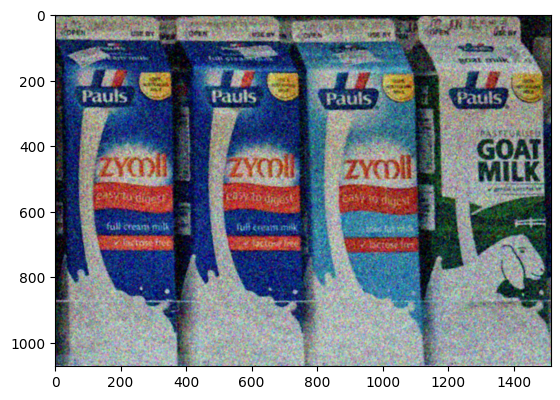

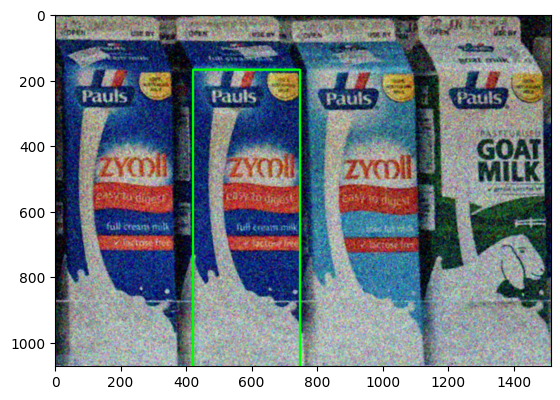

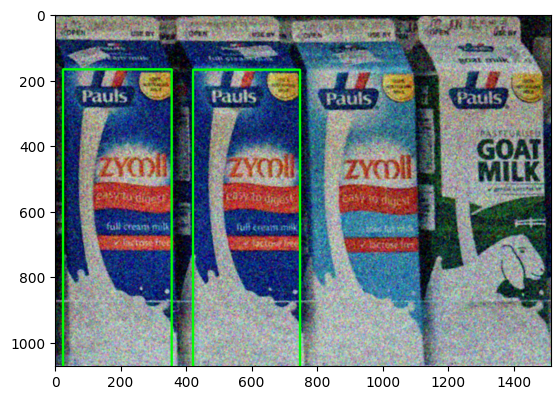


Checking with Template Matching

Product Product dataset/models/ref15.png - 2 instance(s) found:
  Instance 1 {position: (583, 622), width: 326px, height: 905px}
  Instance 2 {position: (189, 624), width: 331px, height: 911px}

============================== Analyzing scene dataset/scenes/scene7.png ==============================



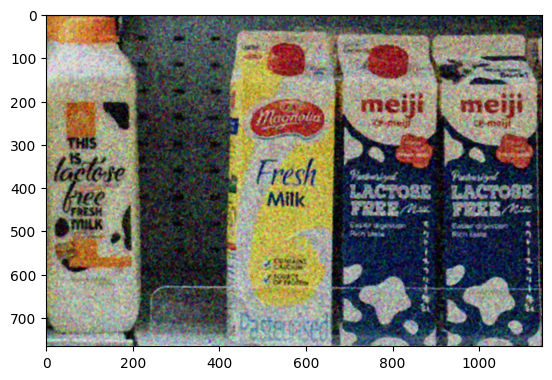

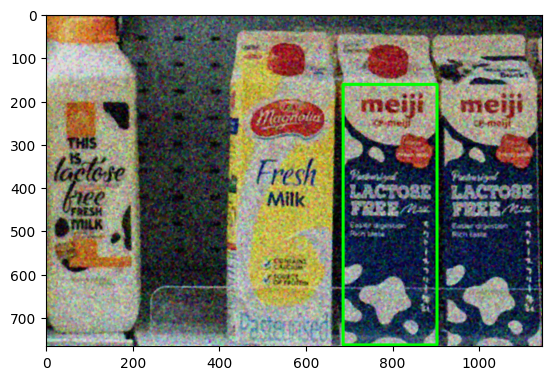

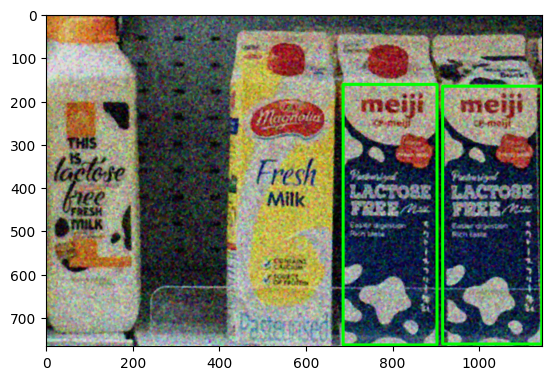

Product Product dataset/models/ref16.png - 2 instance(s) found:
  Instance 1 {position: (794, 462), width: 217px, height: 600px}
  Instance 2 {position: (1030, 464), width: 228px, height: 595px}

============================== Analyzing scene dataset/scenes/scene8.png ==============================



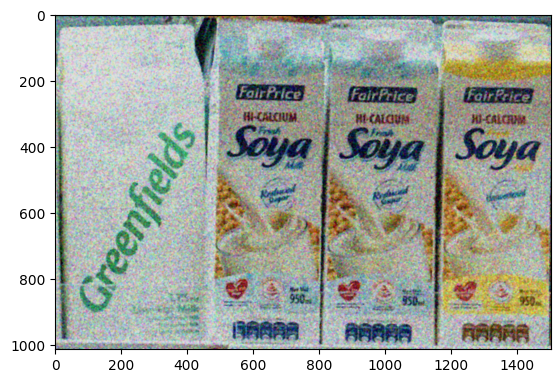

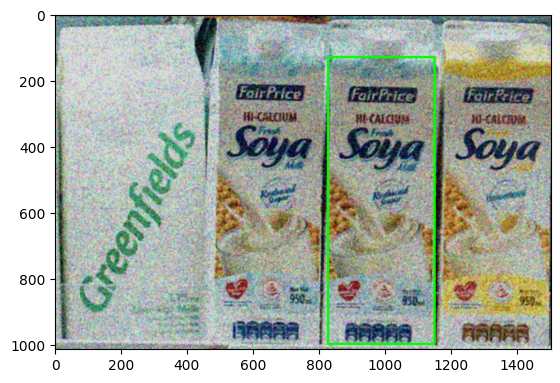

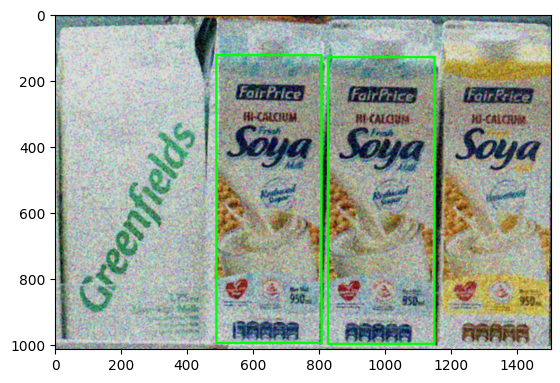

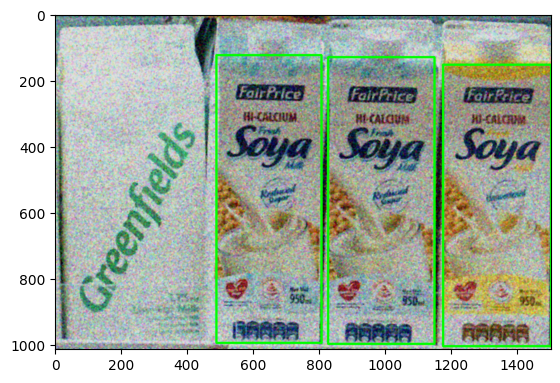


Checking with Template Matching

Product Product dataset/models/ref23.png - 2 instance(s) found:
  Instance 1 {position: (987, 564), width: 321px, height: 867px}
  Instance 2 {position: (647, 559), width: 318px, height: 870px}
Product Product dataset/models/ref24.png - 1 instance(s) found:
  Instance 1 {position: (1337, 579), width: 326px, height: 852px}

============================== Analyzing scene dataset/scenes/scene9.png ==============================



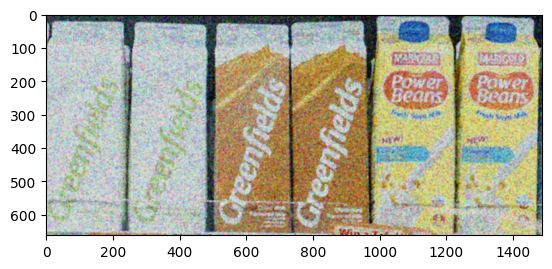

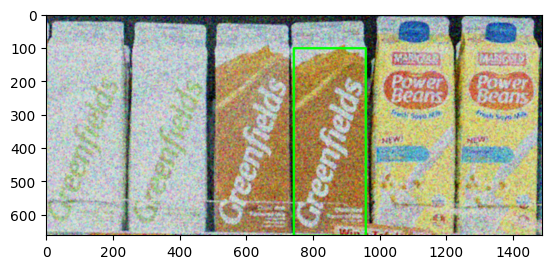

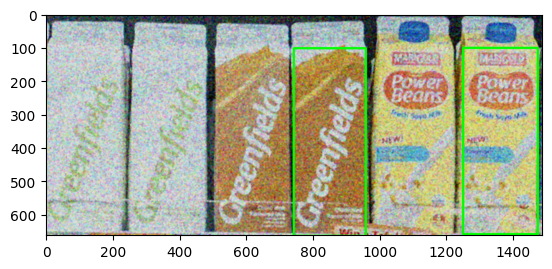

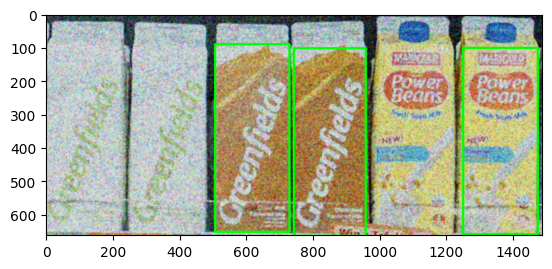

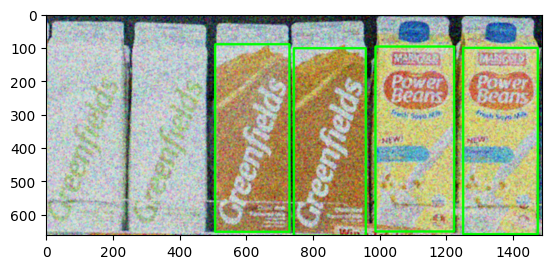


Checking with Template Matching

Product Product dataset/models/ref19.png - 2 instance(s) found:
  Instance 1 {position: (851, 383), width: 216px, height: 562px}
  Instance 2 {position: (618, 371), width: 222px, height: 561px}
Product Product dataset/models/ref20.png - 2 instance(s) found:
  Instance 1 {position: (1363, 380), width: 224px, height: 558px}
  Instance 2 {position: (1106, 374), width: 236px, height: 553px}

============================== Analyzing scene dataset/scenes/scene10.png ==============================



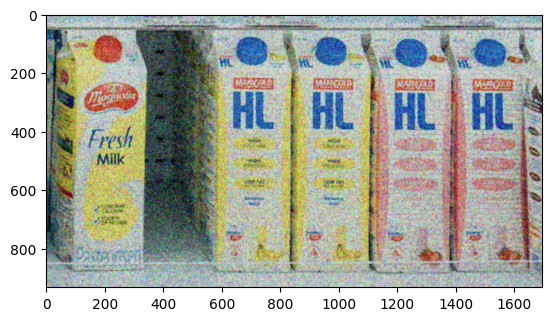

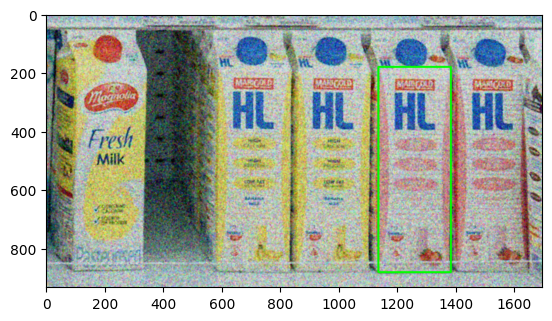

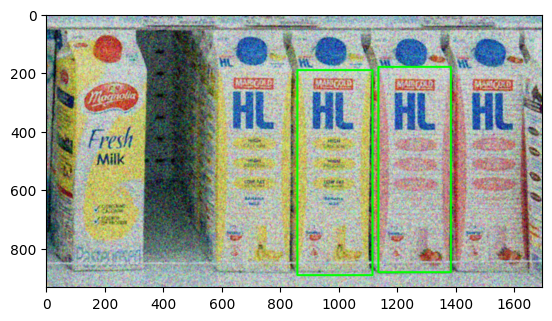

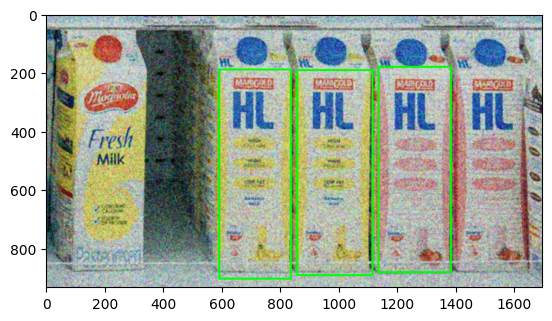

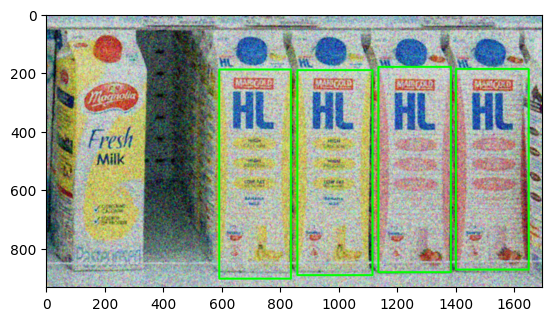

Product Product dataset/models/ref22.png - 2 instance(s) found:
  Instance 1 {position: (1260, 530), width: 248px, height: 701px}
  Instance 2 {position: (1525, 530), width: 248px, height: 685px}
Product Product dataset/models/ref21.png - 2 instance(s) found:
  Instance 1 {position: (987, 541), width: 256px, height: 700px}
  Instance 2 {position: (714, 546), width: 245px, height: 713px}

============================== Analyzing scene dataset/scenes/scene11.png ==============================



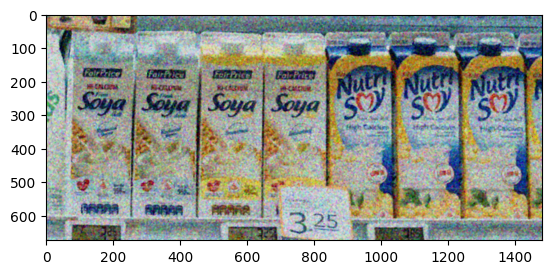

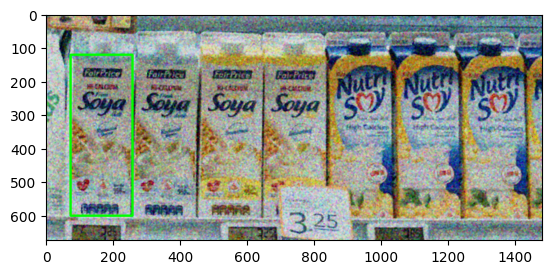

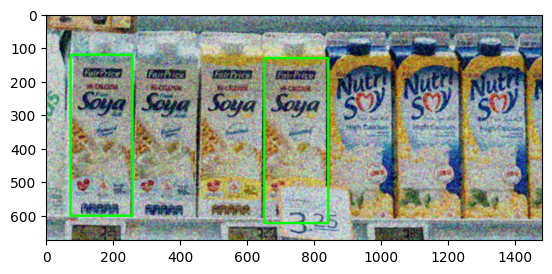

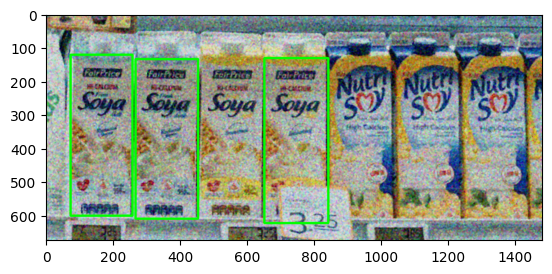

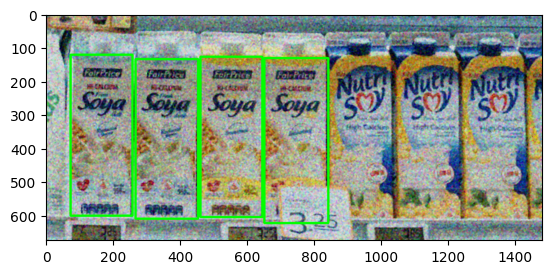

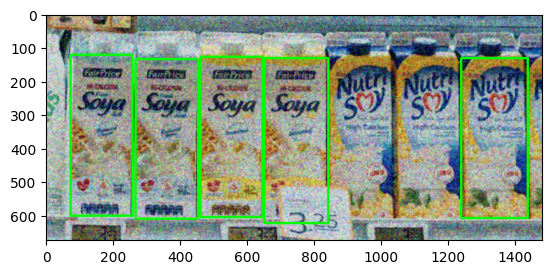


Checking with Template Matching



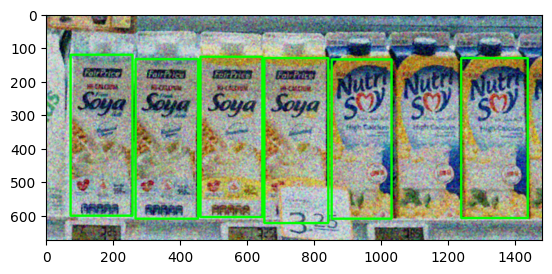

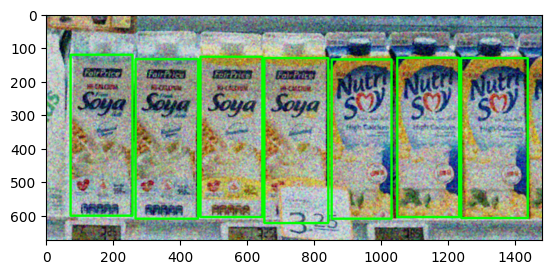

Product Product dataset/models/ref17.png - 2 instance(s) found:
  Instance 1 {position: (166, 361), width: 185px, height: 480px}
  Instance 2 {position: (360, 372), width: 187px, height: 475px}
Product Product dataset/models/ref24.png - 2 instance(s) found:
  Instance 1 {position: (747, 376), width: 190px, height: 491px}
  Instance 2 {position: (553, 366), width: 185px, height: 478px}
Product Product dataset/models/ref25.png - 3 instance(s) found:
  Instance 1 {position: (1339, 369), width: 198px, height: 477px}
  Instance 2 {position: (942, 372), width: 178px, height: 474px}
  Instance 3 {position: (1141, 367), width: 184px, height: 475px}

============================== Analyzing scene dataset/scenes/scene12.png ==============================



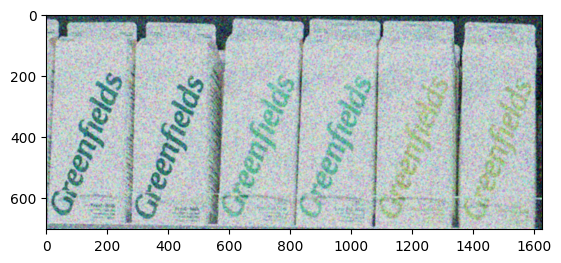

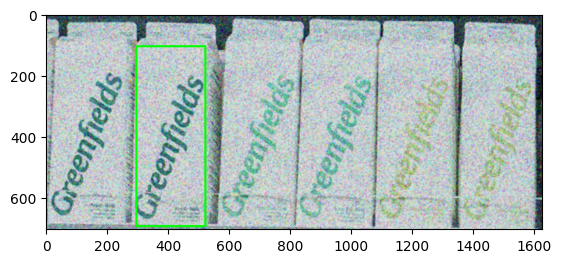

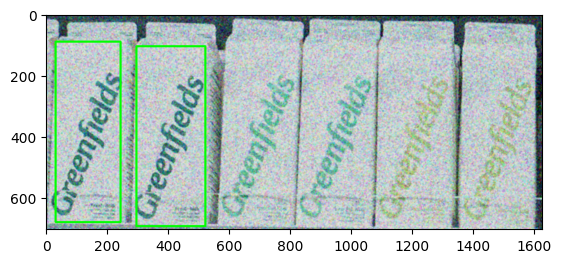


Checking with Template Matching



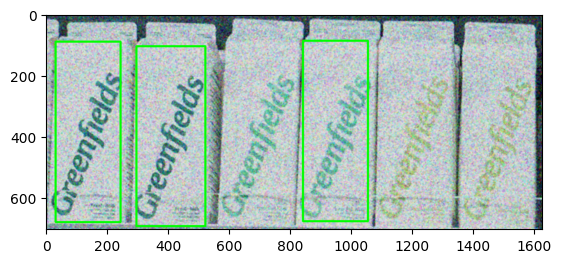


Checking with Template Matching



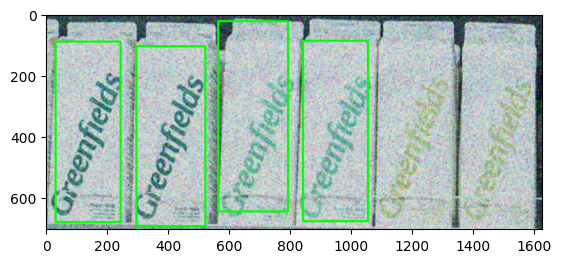


Checking with Template Matching

Product Product dataset/models/ref26.png - 4 instance(s) found:
  Instance 1 {position: (409, 399), width: 226px, height: 589px}
  Instance 2 {position: (137, 385), width: 212px, height: 591px}
  Instance 3 {position: (948, 382), width: 212px, height: 590px}
  Instance 4 {position: (679, 334), width: 229px, height: 622px}


In [18]:
def process_scene_multiple_istances(scene_id, starting_product=15, ending_product=27, verbose=False):
    """
    Processes multiple scene images to detect product instances within a specified range of products.

    Parameters:
        scene_id (int): ID of the scene.
        starting_product (int): Starting product ID for the range.
        ending_product (int): Ending product ID for the range.
        verbose (bool): Enables detailed output if True.
    """
    # getting scene
    img_train_path = f"dataset/scenes/scene{scene_id}.png"
    print(f"\n{'='*30} Analyzing scene {img_train_path} {'='*30}\n")

    # Preprocess the scene image
    img_train, img_filtered = preprocess_scene(img_train_path, k_size=5)
    img_plot = img_filtered.copy()
    plt.imshow(img_plot)
    plt.show()

    found_products = {}
    skip_queries = []
    first_prod_matches = None

    other_istances = True
    while other_istances:
        best_prod = {'Matches': 0, 'Corners': None, 'Product': None, 'Image': None}

        # Iterate over specified range of products and save best product matches
        for i in range(starting_product, ending_product+1):
            product_img_path = f"dataset/models/ref{i}.png"

            # Skip queries that failed Template Matching
            if product_img_path in skip_queries:
                continue

            img_query = load_product_image(i)
            found, corners = object_retrieve_with_hsv_check(img_query, img_filtered, 14, dim_hsv=16, hsv_threshold=0.4)  # normalized difference threshold for hsv

            # Update best product if better match found
            if found > best_prod['Matches']:
                best_prod.update({'Matches': found, 'Corners': corners, 'Product': product_img_path, 'Image': img_query})

        # If at least a product was found a product match calculate dynamic threshold based on that product
        percentage = 2.5
        thresh = thresh_calculator(best_prod['Image'], percentage)

        # Check matches threshold for best product
        # If product exceeds threshold
        if best_prod['Matches'] > thresh:

            # If it's first product match, save the number of matches found for subsequent products
            if first_prod_matches is None:
                first_prod_matches = best_prod['Matches']

            # Decided wether to KEEP it or not with Template Matching if detected product has high disparity with first product
            elif best_prod['Matches'] < first_prod_matches * 0.6:
                print('\nChecking with Template Matching\n')
                clipped_corners = clip_coordinates(best_prod['Corners'], img_filtered.shape[1], img_filtered.shape[0])
                roi = img_filtered[int(clipped_corners[0][0][1]):int(clipped_corners[2][0][1]),
                        int(clipped_corners[0][0][0]):int(clipped_corners[2][0][0])]

                res = template_match(best_prod['Image'], roi)

                if verbose:
                    print(f"Template matching result: {res}")

                #Skip queries that have failed template matching
                if res < 0.96:
                    skip_queries.append(best_prod['Product'])
                    break


            # Calculate object position and dimensions
            obj_dims = calculate_object_position(best_prod['Corners'])

            # checking if aspect ratio of found object corresponds to query
            if similar_aspect_ratio(obj_dims["width in px"], obj_dims["height in px"], best_prod['Image']):
                if verbose:
                    print(f"Object {best_prod['Product']} passed aspect ratio check")

                # Update results dictionary
                product_id = best_prod['Product']
                if f"Product {product_id}" not in found_products:
                    found_products[f"Product {product_id}"] = []
                found_products[f"Product {product_id}"].append(obj_dims)

                # Highlight product on the plot image
                highlight_product(img_plot, best_prod['Corners'])
                plt.imshow(img_plot)
                plt.show()

                # Obscure the detected product instance in filtered image. Thickness = -1 makes full box.
                highlight_product(img_filtered, best_prod['Corners'], color=(0, 0, 0), thickness=-1)

            # if failed aspect ratio check
            else:
                other_istances=False

        #If product doesn't exceed threshold stop
        else:
            other_istances=False


    # Print the results of current scene. Enumarating the number of istances
    for product_id, instances in found_products.items():
        print(f"Product {product_id} - {len(instances)} instance(s) found:")
        for idx, instance in enumerate(instances):
            pos = instance['position']
            width = instance['width in px']
            height = instance['height in px']
            print(f"  Instance {idx + 1} {{position: {pos}, width: {width}px, height: {height}px}}")


# Looping over scenes
for j in range(6, 12+1):
    process_scene_multiple_istances(j,starting_product=15, ending_product=27)

### Considerations
In the last scene ref27 product is being mistaken with the ref26. This is a hard problem to address since SIFT works on the grayscale version of an image, ignoring the color channels entirely. As stated above, a function that introduces color check to discard matching keypoints with very different color patches around the point has been introduced to try to address this issue. Due to high noise in the images, this hasn't given improved results.